In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd /content/gdrive/MyDrive
!git clone https://github.com/ultralytics/yolov5.git


/content/gdrive/MyDrive
Cloning into 'yolov5'...
remote: Enumerating objects: 14974, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 14974 (delta 6), reused 9 (delta 3), pack-reused 14960
Receiving objects: 100% (14974/14974), 13.60 MiB | 9.06 MiB/s, done.
Resolving deltas: 100% (10347/10347), done.


In [ ]:
%cd yolov5/

/content/gdrive/MyDrive/yolov5


In [ ]:
!pip install -U -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 793 kB 34.8 MB/s 
     |████████████████████████████████| 11.2 MB 55.5 MB/s 
     |████████████████████████████████| 3.2 MB 59.9 MB/s 
     |████████████████████████████████| 280 kB 6.2 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
     |██████████████████████████████  | 834.1 MB 1.3 MB/s eta 0:00:45tcmalloc: large alloc 1147494400 bytes == 0x40a4000 @  0x7f1712cf6615 0x58ead6 0x4f355e 0x4d222f 0x51041f 0x5b4ee6 0x58ff2e 0x510325 0x5b4ee6 0x58ff2e 0x50d482 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4bac0a 0x538a76 0x590ae5 0x510280 0x5b4ee6 0x58ff2e 0x50d482 0x5b4ee6 0x58ff2e 0x50c4fc 0x58fd37 0x50ca37 0x5b4ee6 0x58ff2e
     |████████████████████████████████| 890.2 MB 6.8 kB/s 
     |████████████████████████████████| 24.3 MB 55.7 MB/s 
     |████████████████████████████████| 6.0 MB 40.9 MB/s 
     |██████████████████████

Get Roboflow

In [ ]:
!pip install roboflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 41 kB 576 kB/s 
     |████████████████████████████████| 138 kB 52.6 MB/s 
     |████████████████████████████████| 178 kB 59.6 MB/s 
     |████████████████████████████████| 67 kB 6.3 MB/s 
     |████████████████████████████████| 54 kB 2.9 MB/s 
     |████████████████████████████████| 145 kB 61.7 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=b7e147fe8b82876c231866a8a88149613f6f7f873bf1c97cb8d4178093b88dfa
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Suc

Get dataset from roboflow

In [ ]:
%cd /content/gdrive/MyDrive/yolov5

#### ROBOFLOW DATASET DOWNLOAD CODE #####

from roboflow import Roboflow
rf = Roboflow(api_key="d3w3B3O2XU7blq9oFaHN")
project = rf.workspace("mechatronics-lab").project("turtlebot-predictor")
dataset = project.version(10).download("yolov5")

/content/gdrive/MyDrive/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Turtlebot-Predictor-10 in yolov5pytorch:: 100%|██████████| 1460/1460 [00:10<00:00, 142.91it/s]


In [ ]:
%cd /content/gdrive/MyDrive/yolov5

/content/gdrive/MyDrive/yolov5


In [ ]:
#!python train.py --batch 16 --cfg cfg/training/yolov7.yaml --epochs 50 --data {dataset.location}/data.yaml --weights 'yolov7.pt' --device 0 

In [ ]:
!python train.py --img 416 --batch 16 --epochs 50 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache


train: weights=yolov5s.pt, cfg=, data=/content/gdrive/MyDrive/yolov5/Turtlebot-Predictor-10/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-240-gabbfd69 Python-3.7.15 torch-1.13.0+cu117 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

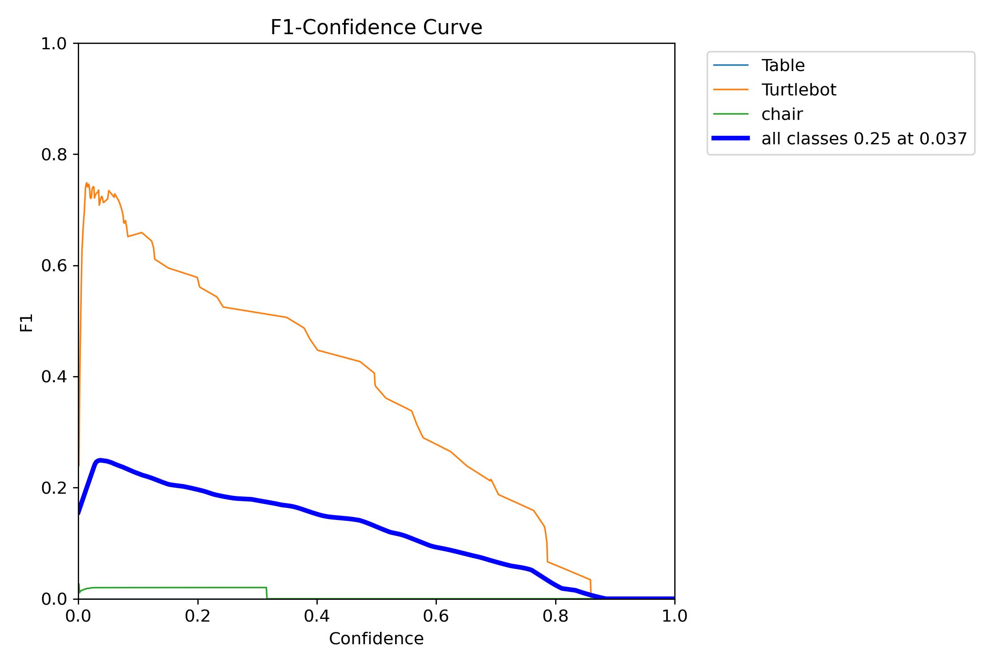

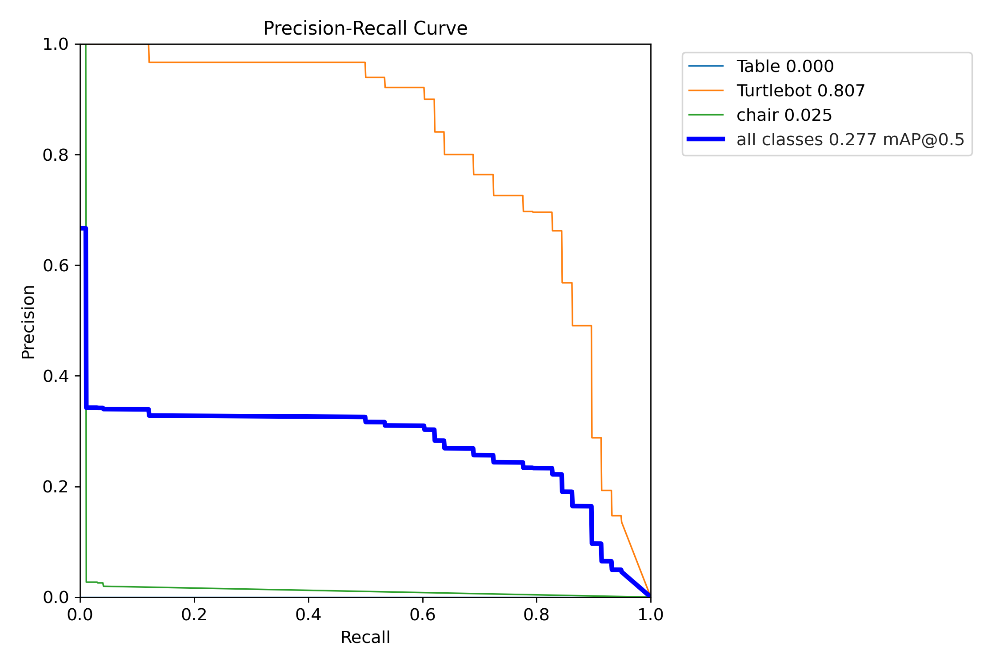

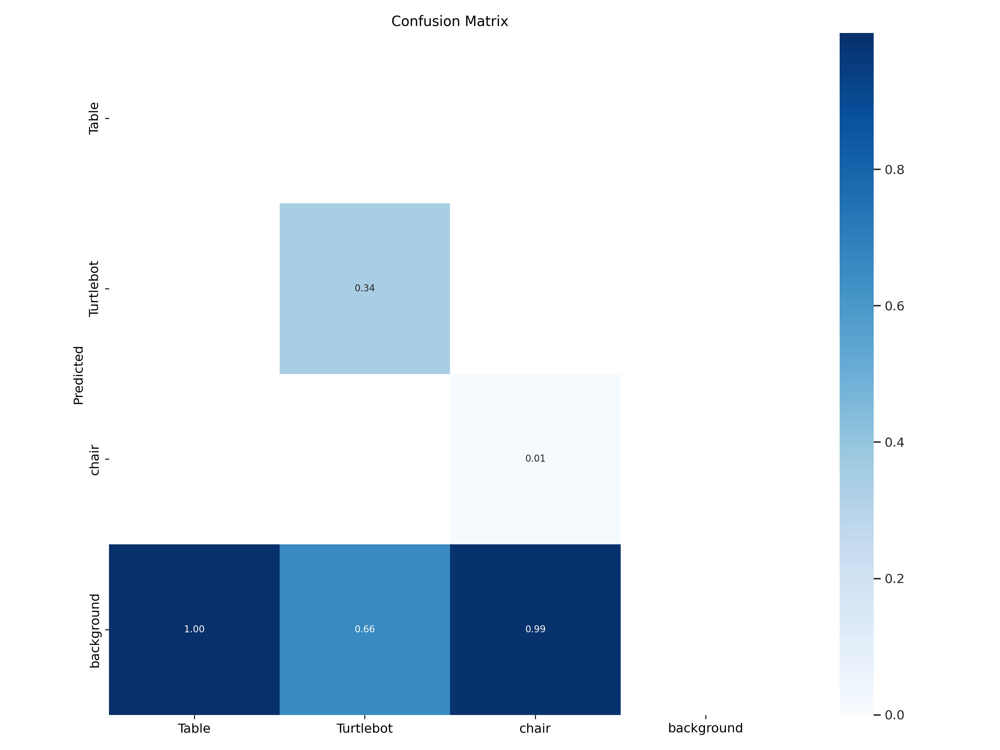

In [ ]:
from IPython.display import Image
display(Image("/content/gdrive/MyDrive/yolov5/runs/train/exp/F1_curve.png", width=400, height=400))
display(Image("/content/gdrive/MyDrive/yolov5/runs/train/exp/PR_curve.png", width=400, height=400))
display(Image("/content/gdrive/MyDrive/yolov5/runs/train/exp/confusion_matrix.png", width=500, height=500))

Test image

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images


detect: weights=['runs/train/exp/weights/best.pt'], source=/content/gdrive/MyDrive/yolov5/Turtlebot-Predictor-10/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-240-gabbfd69 Python-3.7.15 torch-1.13.0+cu117 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/33 /content/gdrive/MyDrive/yolov5/Turtlebot-Predictor-10/test/images/IMG_1937_jpeg.rf.2027c704fa810952451435cf93ede36c.jpg: 416x416 1 Turtlebot, 8.3ms
image 2/33 /content/gdrive/MyDrive/yolov5/Turtlebot-Predictor-10/test/images/IMG_1950_jpeg.rf.c1514d1fc4bee7a08f73fa51f351e57e.jpg: 416x416 1 

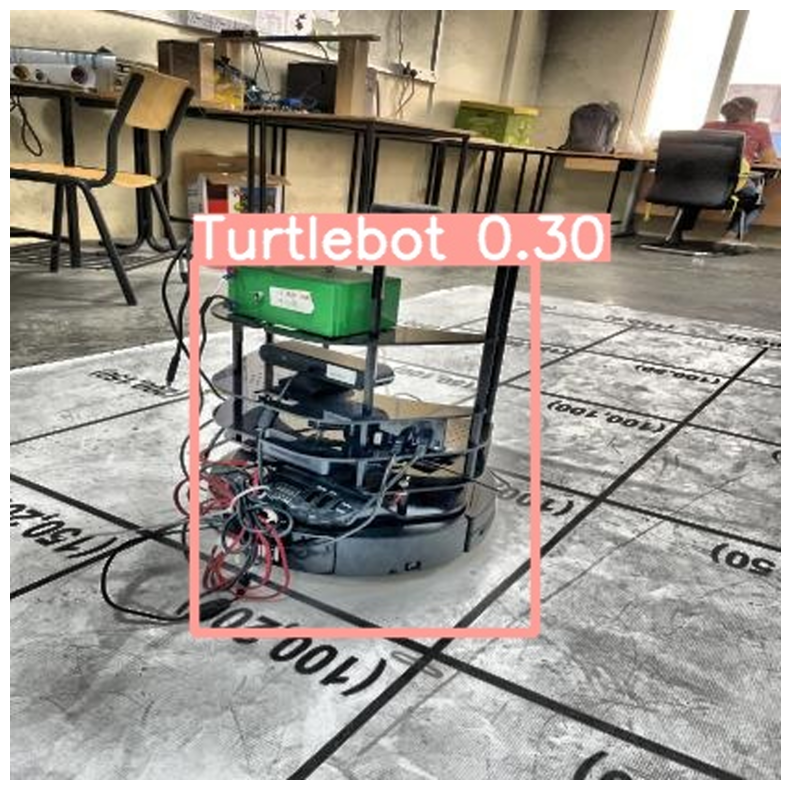

In [ ]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

image = cv2.imread("/content/gdrive/MyDrive/yolov5/runs/detect/exp/IMG_1950_jpeg.rf.c1514d1fc4bee7a08f73fa51f351e57e.jpg")
height, width = image.shape[:2]
resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

fig = plt.gcf()
fig.set_size_inches(18, 10)
plt.axis("off")
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.show()

Test Video

In [ ]:
#!python detect.py --source testimages/testvid.mov --weights yolov5s.pt --conf 0.4

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images/Turtlebottest.mp4


detect: weights=['runs/train/exp/weights/best.pt'], source=/content/gdrive/MyDrive/yolov5/Turtlebot-Predictor-10/test/images/Turtlebottest.mp4, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-240-gabbfd69 Python-3.7.15 torch-1.13.0+cu117 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/1061) /content/gdrive/MyDrive/yolov5/Turtlebot-Predictor-10/test/images/Turtlebottest.mp4: 416x256 1 Turtlebot, 12.8ms
video 1/1 (2/1061) /content/gdrive/MyDrive/yolov5/Turtlebot-Predictor-10/test/images/Turtlebottest.mp4: 416x256 1 Turtlebot, 9.1ms
video 1/1 (3/1061) /

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

Download weights

In [ ]:
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>